In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd

from os.path import join

import plotly.graph_objects as go
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from shapely.geometry import Point, LineString

In [2]:
DATA_DIR = 'gtfs'

Read dataset

In [3]:
shapes_df = pd.read_csv(join(DATA_DIR, 'shapes.txt'))
stops_df = pd.read_csv(join(DATA_DIR, 'stops.txt'))
trips_df = pd.read_csv(join(DATA_DIR, 'trips.txt'))
routes_df = pd.read_csv(join(DATA_DIR, 'routes.txt'))
stops_df = pd.read_csv(join(DATA_DIR, 'stops.txt'))
stop_times_df = pd.read_csv(join(DATA_DIR, 'stop_times.txt'))
calendar_df = pd.read_csv(join(DATA_DIR, 'calendar.txt'))
calendar_exception_df = pd.read_csv(join(DATA_DIR, 'calendar_dates.txt'))

Check types of services and exceptions

In [4]:
calendar_df

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,service_2,0,0,0,0,0,1,0,20250329,20250627
1,service_3,0,0,0,0,0,0,1,20250329,20250627
2,service_1,1,1,1,0,0,0,0,20250329,20250627
3,service_5,0,0,0,1,0,0,0,20250329,20250627
4,service_4,0,0,0,0,1,0,0,20250329,20250627


In [5]:
calendar_exception_df

,service_id,date,exception_type
0,service_2,20250503,2
1,service_3,20250421,1
2,service_3,20250501,1
3,service_3,20250503,1
4,service_3,20250619,1
5,service_1,20250421,2
6,service_5,20250501,2
7,service_5,20250619,2


Find most popular routes 

In [6]:
counts = trips_df[trips_df['direction_id'] == 1].groupby(['route_id', 'direction_id'])['trip_id'].count().reset_index()
counts['route_direction'] = counts['route_id'].astype(str) + ' - ' + counts['direction_id'].astype(str)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=counts['trip_id'], 
    y=counts['route_direction'], 
    orientation='h', 
    text=counts['trip_id'],
    textposition='outside'
))

fig.update_layout(
    title='Number of courses for route ',
    xaxis_title='Number of courses',
    yaxis_title='route',
    yaxis={'categoryorder': 'total ascending'}
)

fig.show()


In [7]:
coords = shapes_df[["shape_pt_lat", "shape_pt_lon", "shape_pt_sequence"]]
coords_roll_1 = np.roll(coords, 1, axis=0)
segments = pd.DataFrame(np.concatenate([coords_roll_1, coords], axis=1), columns=["start_lat", "start_lng", "start_seq", "end_lat", "end_lng", "end_seq"])
segments_df = shapes_df[["shape_id"]].join(segments)
segments_df = segments_df[segments_df.end_seq != 1]
segments_df = segments_df.drop(columns=['end_seq']).rename(columns={ "start_seq": "seq" })

In [8]:
segments_df.head()

,shape_id,start_lat,start_lng,seq,end_lat,end_lng
1,shape_6254,50.088569,19.931231,1.0,50.084464,19.930583
2,shape_6254,50.084464,19.930583,2.0,50.084464,19.930583
3,shape_6254,50.084464,19.930583,3.0,50.084011,19.927692
4,shape_6254,50.084011,19.927692,4.0,50.084011,19.927692
5,shape_6254,50.084011,19.927692,5.0,50.081518,19.916122


In [9]:
shape_per_day = trips_df[trips_df['direction_id'] == 1].groupby(['shape_id'])['trip_id'].count().reset_index()

In [10]:
segments_df.dtypes

shape_id      object
start_lat    float64
start_lng    float64
seq          float64
end_lat      float64
end_lng      float64
dtype: object

In [11]:
shape_per_day.dtypes

shape_id    object
trip_id      int64
dtype: object

In [12]:
segment_per_day = pd.merge(segments_df, shape_per_day, left_on="shape_id", right_on="shape_id")

In [13]:
segment_per_day

,shape_id,start_lat,start_lng,seq,end_lat,end_lng,trip_id
0,shape_6256,50.043326,19.819836,1.0,50.044518,19.827431,201
1,shape_6256,50.044518,19.827431,2.0,50.044518,19.827431,201
2,shape_6256,50.044518,19.827431,3.0,50.048657,19.826242,201
3,shape_6256,50.048657,19.826242,4.0,50.048657,19.826242,201
4,shape_6256,50.048657,19.826242,5.0,50.053613,19.827051,201
...,...,...,...,...,...,...,...
141389,shape_6510,50.017976,19.889389,332.0,50.018036,19.889280,24
141390,shape_6510,50.018036,19.889280,333.0,50.018094,19.889179,24
141391,shape_6510,50.018094,19.889179,334.0,50.018278,19.889187,24
141392,shape_6510,50.018278,19.889187,335.0,50.018319,19.889187,24


In [14]:
segment_day_trips = segment_per_day.groupby(by=["start_lat", "start_lng", "end_lat", "end_lng"]).sum("trip_id").reset_index()

<Axes: >

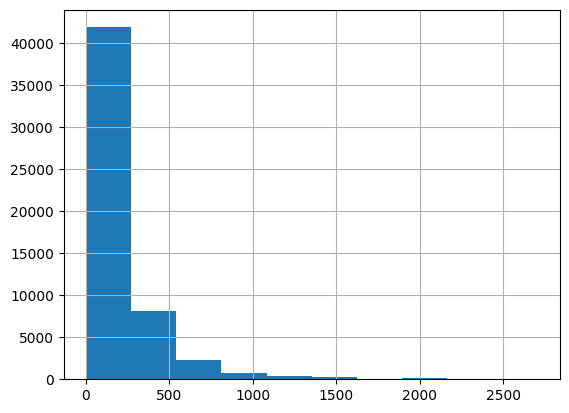

In [15]:
segment_day_trips['trip_id'].hist()

In [16]:
def get_line_string(row):
    start = Point(row.start_lng, row.start_lat)
    end = Point(row.end_lng, row.end_lat)
    line = LineString([start, end])
    row["geometry"] = line
    return row



In [17]:
vmin = segment_day_trips["trip_id"].min()
vmax = segment_day_trips["trip_id"].quantile(.95)
vcenter = segment_day_trips["trip_id"].mean()
norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

In [18]:
segment_day_trips_gpd = gpd.GeoDataFrame(segment_day_trips.apply(get_line_string, axis=1)).set_crs(epsg=4326)

<Axes: >

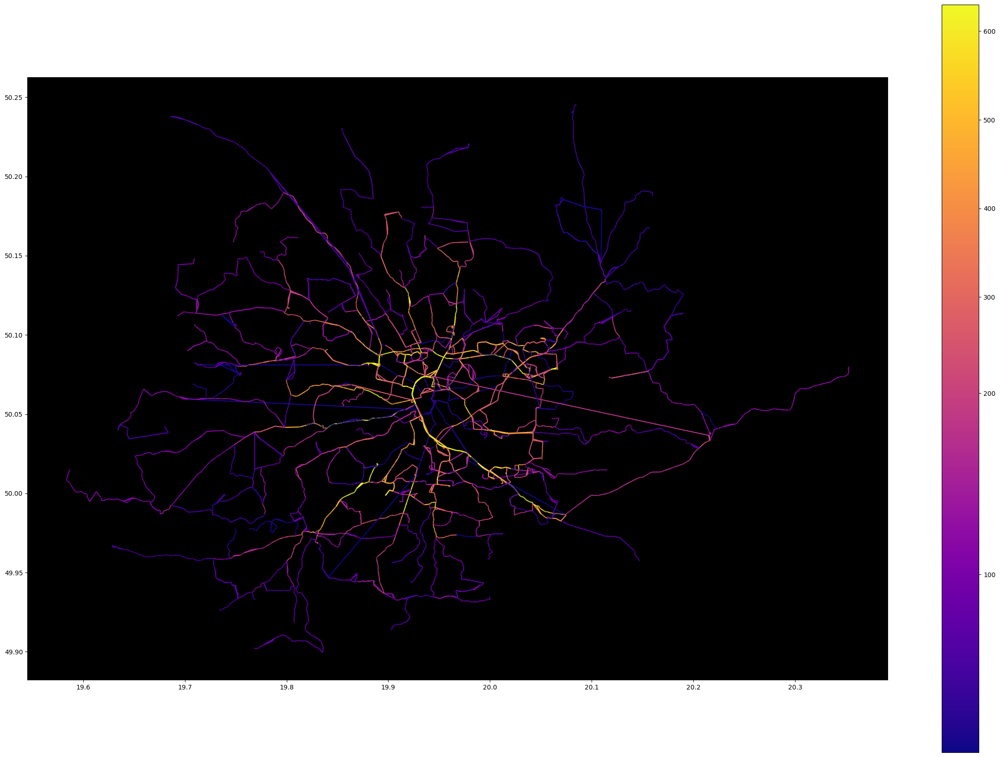

In [19]:
fig = plt.figure(figsize=(30,21))
ax = plt.axes()
ax.set(facecolor = "black")
segment_day_trips_gpd.plot(ax=ax, cmap="plasma", column='trip_id', legend=True, norm=norm)

## Data Preparation & Edge Construction

In [20]:
import pandas as pd
import networkx as nx

# merging stop_times with trips to get direction information
stop_times_with_direction = pd.merge(
    stop_times_df, 
    trips_df[['trip_id', 'direction_id']], 
    on='trip_id'
)

# filtering for direction_id = 1 and sort stops
direction_1_stop_times = stop_times_with_direction[
    stop_times_with_direction['direction_id'] == 1
].sort_values(['trip_id', 'stop_sequence'])

# edges between consecutive stops
direction_1_stop_times['to_stop'] = direction_1_stop_times.groupby('trip_id')['stop_id'].shift(-1)
edges_df = direction_1_stop_times.dropna(subset=['to_stop'])[['stop_id', 'to_stop']]
edges_df.columns = ['from_stop', 'to_stop']

# edge weights
edge_weights = edges_df.groupby(['from_stop', 'to_stop']).size().reset_index(name='weight')

##  Graph Construction

In [21]:
G = nx.DiGraph()
for _, row in edge_weights.iterrows():
    G.add_edge(row['from_stop'], row['to_stop'], weight=row['weight'])

## Centrality Calculations
Eigenvector Centrality (Values indicate influence based on connection quality):


In [22]:
eigen_centrality = nx.eigenvector_centrality(G, weight='weight', max_iter=1000)


PageRank (Probability distribution representing node importance):

In [23]:
pagerank = nx.pagerank(G, weight='weight')


Betweenness Centrality

In [24]:
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

Simple degree 

In [25]:
degree_centrality = nx.degree_centrality(G)

## Merge Results with Stop Information

In [26]:
# Convert results to DataFrames
eigen_df = pd.DataFrame.from_dict(eigen_centrality, orient='index', 
                                columns=['eigenvector_centrality']).reset_index()
eigen_df.columns = ['stop_id', 'eigenvector_centrality']

pagerank_df = pd.DataFrame.from_dict(pagerank, orient='index', 
                                   columns=['pagerank']).reset_index()
pagerank_df.columns = ['stop_id', 'pagerank']

betweenness_centrality_df = pd.DataFrame.from_dict(betweenness_centrality, orient='index', 
                                columns=['betweenness_centrality']).reset_index()
betweenness_centrality_df.columns = ['stop_id', 'betweenness_centrality']

degree_centrality_df = pd.DataFrame.from_dict(degree_centrality, orient='index', 
                                columns=['degree_centrality']).reset_index()
degree_centrality_df.columns = ['stop_id', 'degree_centrality']

# Add stop details
stops_info = stops_df[['stop_id', 'stop_name', 'stop_lat', 'stop_lon']]
eigen_df = pd.merge(eigen_df, stops_info, on='stop_id')
pagerank_df = pd.merge(pagerank_df, stops_info, on='stop_id')
betweenness_centrality_df = pd.merge(betweenness_centrality_df, stops_info, on='stop_id')
degree_centrality_df = pd.merge(degree_centrality_df, stops_info, on='stop_id')

In [27]:
import folium
from folium.plugins import MarkerCluster
import numpy as np

# creating map centered at the mean coordinates
center_lat = eigen_df['stop_lat'].mean()
center_lon = eigen_df['stop_lon'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# normalizing eigenvector centrality for better visualization
eigen_df['normalized_centrality'] = eigen_df['eigenvector_centrality'] / eigen_df['eigenvector_centrality'].max()

# adding markers with radius proportional to eigenvector centrality
for idx, row in eigen_df.iterrows():
    radius = 5 + (row['normalized_centrality'] * 30) 
    color = f'#{int(255 * row["normalized_centrality"]):02x}0000'  # red intensity
    
    folium.CircleMarker(
        location=[row['stop_lat'], row['stop_lon']],
        radius=radius,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=f"Stop: {row['stop_name']}<br>Centrality: {row['eigenvector_centrality']:.4f}"
    ).add_to(m)

m

In [28]:
import folium
from folium.plugins import MarkerCluster
import numpy as np

center_lat = eigen_df['stop_lat'].mean()
center_lon = eigen_df['stop_lon'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

eigen_df['normalized_centrality'] = eigen_df['eigenvector_centrality'] / eigen_df['eigenvector_centrality'].max()

# creating a dictionary mapping stop_id to [lat, lon] for quick lookups
stop_coords = {}
for _, row in eigen_df.iterrows():
    stop_coords[row['stop_id']] = [row['stop_lat'], row['stop_lon']]

# checking what edge_weights is and print its type and structure
print(f"Type of edge_weights: {type(edge_weights)}")
print(f"First few elements of edge_weights: {edge_weights[:3] if hasattr(edge_weights, '__getitem__') else edge_weights}")


try:
    print(f"edges_df shape: {edges_df.shape}")
    
    edge_weights_df = edges_df.groupby(['from_stop', 'to_stop']).size().reset_index(name='weight')
    
    max_weight = edge_weights_df['weight'].max()
    min_weight = edge_weights_df['weight'].min()
    
    # adding edges as lines between stops
    for _, edge in edge_weights_df.iterrows():
        from_stop = edge['from_stop']
        to_stop = edge['to_stop']
        
        # skipping if stop doesn't have coordinates
        if from_stop not in stop_coords or to_stop not in stop_coords:
            continue
        
        # calculating line width and opacity based on edge weight
        weight_normalized = (edge['weight'] - min_weight) / (max_weight - min_weight) if max_weight > min_weight else 0.5
        line_weight = 2 + weight_normalized * 6  # width
        opacity = 0.3 + weight_normalized * 0.5  # opacity
        
        # drawing the connection
        folium.PolyLine(
            locations=[stop_coords[from_stop], stop_coords[to_stop]],
            color='red',
            weight=line_weight,
            opacity=opacity,
            popup=f"Connection weight: {edge['weight']}"
        ).add_to(m)
except NameError:
    print("edges_df not found, please provide the original edge data")
    if 'G' in globals():
        print("Using graph G to extract edges")
        for u, v, data in G.edges(data=True):
            if u in stop_coords and v in stop_coords:
                weight = data.get('weight', 1)
                folium.PolyLine(
                    locations=[stop_coords[u], stop_coords[v]],
                    color='red',
                    weight=2 + min(weight/10, 6), 
                    opacity=0.5,
                    popup=f"Connection weight: {weight}"
                ).add_to(m)

# adding the nodes (stops) on top of the edges
for idx, row in eigen_df.iterrows():
    radius = 5 + (row['normalized_centrality'] * 30)  # scale the radius
    color = f'#{int(255 * row["normalized_centrality"]):02x}0000'  # red intensity
    
    folium.CircleMarker(
        location=[row['stop_lat'], row['stop_lon']],
        radius=radius,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=f"Stop: {row['stop_name']}<br>Centrality: {row['eigenvector_centrality']:.4f}"
    ).add_to(m)

m

Type of edge_weights: <class 'pandas.core.frame.DataFrame'>
First few elements of edge_weights:           from_stop           to_stop  weight
0  stop_1001_249402  stop_2434_350202      80
1  stop_1005_249901    stop_559_79301     186
2  stop_1005_249902    stop_558_79202     109
edges_df shape: (412466, 2)


# Most Central Stops (Eigenvector Centrality)
Highly connected stops to other highly connected stops.

Part of the core of the network, where influence flows through central hubs. Typically found in dense, central areas of the transit system.


In [29]:
print("Most Central Stops (Eigenvector):")
print(eigen_df.sort_values('eigenvector_centrality', ascending=False).head(5))

Most Central Stops (Eigenvector):
               stop_id  eigenvector_centrality              stop_name  \
203   stop_1089_260807                0.490931  Dworzec Główny Zachód   
41        stop_51_7306                0.451528           Politechnika   
623       stop_50_7103                0.275450           Nowy Kleparz   
1666  stop_1089_260809                0.248293  Dworzec Główny Zachód   
712       stop_55_7903                0.189966         Plac Inwalidów   

       stop_lat   stop_lon  normalized_centrality  
203   50.067783  19.945273               1.000000  
41    50.071279  19.944103               0.919738  
623   50.073617  19.937271               0.561076  
1666  50.067204  19.944498               0.505760  
712   50.069381  19.926953               0.386951  


1. Dworzec Główny Zachód	0.489	**Major hub, highly influential in the network core.**
2. Politechnika	0.450	**Key connector, likely surrounded by other busy stops.**
3. Nowy Kleparz	0.275	**Important, but less connected to other "central" stops.**

# Most Important Stops (PageRank)
PageRank looks at importance from a flow/passing-through perspective, inspired by web links. A stop is important if:

Many other stops lead to it.
It receives "attention" from other important stops.
It may not be central geographically or densely connected, but it's still frequently visited or passed through.

In [30]:

print("\nMost Important Stops (PageRank):")
print(pagerank_df.sort_values('pagerank', ascending=False).head(5))


Most Important Stops (PageRank):
               stop_id  pagerank            stop_name   stop_lat   stop_lon
1671    stop_526_74301  0.002739               Bujaka  50.010339  19.948843
8     stop_1654_314104  0.002512      Muzeum Narodowe  50.058644  19.925202
775     stop_532_74902  0.002483       Góra Borkowska  50.007410  19.925282
380        stop_7_1203  0.002425  Rondo Ofiar Katynia  50.086632  19.891059
1474    stop_530_74704  0.002362        Borek Fałęcki  50.011291  19.926720


1. Muzeum Narodowe	0.00277	**Major destination or a transfer stop.**
2. Góra Borkowska	0.00257	**Probably a key terminus or transfer node.**
3. Borek Fałęcki	0.00242	**Important southern node, even if periphera**

In [31]:
print("\nMost Important Stops (Betweenness):")
print(betweenness_centrality_df.sort_values('betweenness_centrality', ascending=False).head(5))


Most Important Stops (Betweenness):
               stop_id  betweenness_centrality              stop_name  \
203   stop_1089_260807                0.215003  Dworzec Główny Zachód   
914   stop_1921_324201                0.169261      Teatr Słowackiego   
1278    stop_261_35807                0.166046            Starowiślna   
1279    stop_260_35704                0.145606          Poczta Główna   
918   stop_1921_324203                0.145395      Teatr Słowackiego   

       stop_lat   stop_lon  
203   50.067783  19.945273  
914   50.064639  19.945657  
1278  50.056722  19.946044  
1279  50.059311  19.942837  
918   50.064008  19.945092  


In [32]:
print("\nMost Important Stops (Degree):")
print(degree_centrality_df.sort_values('degree_centrality', ascending=False).head(5))


Most Important Stops (Degree):
               stop_id  degree_centrality           stop_name   stop_lat  \
158   stop_1068_258602           0.004126     Jerzmanowskiego  50.010637   
82    stop_2309_345906           0.004126       Bronowice SKA  50.080823   
1037  stop_2108_333803           0.003610  Rondo Grunwaldzkie  50.048252   
722      stop_81_11002           0.003610            Wiślicka  50.087576   
83      stop_103_13507           0.003610      Bronowice Małe  50.082202   

       stop_lon  
158   20.008024  
82    19.890659  
1037  19.932344  
722   20.002118  
83    19.883499  
